### Imports

In [1]:
import sys
import cv2 as cv
import re
from scripts import tf_text_graph_common
import tensorflow  as tf
import numpy as np
import matplotlib.pyplot as plt

from scripts import tf_text_graph_ssd

#### Get the model paths

In [2]:
model_file = "models/ssd_mobilenet_v2_coco_2018_03_29/frozen_inference_graph.pb"
pipeline_config = "models/ssd_mobilenet_v2_coco_2018_03_29/pipeline.config"

In [3]:
# Output path
config_file = "models/ssd_mobilenet_v2_coco_2018_03_29/saved_model/ssd_mobilenet_v2_coco_2018_03_29.pbtxt"

# creat ssd graph
tf_text_graph_ssd.createSSDGraph(model_file, pipeline_config, config_file)

Scale: [0.200000-0.950000]
Aspect ratios: [1.0, 2.0, 0.5, 3.0, 0.333299994469]
Reduce boxes in the lowest layer: True
Number of classes: 90
Number of layers: 6
box predictor: convolutional
Input image size: 300x300


In [4]:
# Get class labels
with open("models/ssd_mobilenet_v2_coco_2018_03_29/labels.txt", "r") as f:
    labels = f.read().split("\n")

#### Read the Tensorflow model

In [5]:
net = cv.dnn.readNetFromTensorflow(model_file, config_file)

In [6]:
def detect_objects(net, im):
    dim = 300

    blob = cv.dnn.blobFromImage(im, size=(dim, dim), swapRB=True, crop=False)

    net.setInput(blob)

    objects = net.forward()

    return objects

In [7]:
def display_text(im, text, x, y):
    # Get text size and baseline
    text_size = cv.getTextSize(text, cv.FONT_HERSHEY_SIMPLEX, 0.6, 1)
    dim = text_size[0]
    baseline = text_size[1]
    
    # Draw a filled rectangle for text background
    cv.rectangle(im, (x, y - dim[1] - baseline), (x + dim[0], y+baseline), (255, 255, 255), cv.FILLED)
    
    # Overlay the text on top
    cv.putText(im, text, (x, y - baseline), cv.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 0), 1, cv.LINE_AA)

In [8]:
def display_objects_static(im, objects, threshold=0.25):

    rows = im.shape[0]; cols = im.shape[1]

    for i in range(objects.shape[2]):

        class_id = int(objects[0, 0, i, 1])
        score = float(objects[0, 0, i, 2])

        # Retrieve original coordinates
        x = int(objects[0, 0, i, 3] * cols)
        y = int(objects[0, 0, i, 4] * rows)
        w = int(objects[0, 0, i, 5] * cols) - x
        h = int(objects[0, 0, i, 6] * rows) - y

        # Check if score is above threshold
        if score > threshold:

            # Display bounding box
            display_text(im, f"  {labels[class_id-1]} {round(score,2)}  ", x, y)
            cv.rectangle(im, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Convert image to RGB
    mp_img = cv.cvtColor(im, cv.COLOR_BGR2RGB)
    plt.figure(figsize=(30, 10)); plt.imshow(mp_img); plt.axis('off'), plt.show()

In [9]:
def display_objects_live(im, objects, threshold=0.25):

    rows = im.shape[0]; cols = im.shape[1]

    for i in range(objects.shape[2]):

        class_id = int(objects[0, 0, i, 1])
        score = float(objects[0, 0, i, 2])

        # Retrieve original coordinates
        x = int(objects[0, 0, i, 3] * cols)
        y = int(objects[0, 0, i, 4] * rows)
        w = int(objects[0, 0, i, 5] * cols) - x
        h = int(objects[0, 0, i, 6] * rows) - y

        # Check if score is above threshold
        if score > threshold:

            # Display bounding box
            display_text(im, f"  {labels[class_id-1]} {round(score,2)}  ", x, y)
            cv.rectangle(im, (x, y), (x + w, y + h), (0, 255, 0), 2)

    # Convert image to RGB
    mp_img = cv.cvtColor(im, cv.COLOR_BGR2RGB)

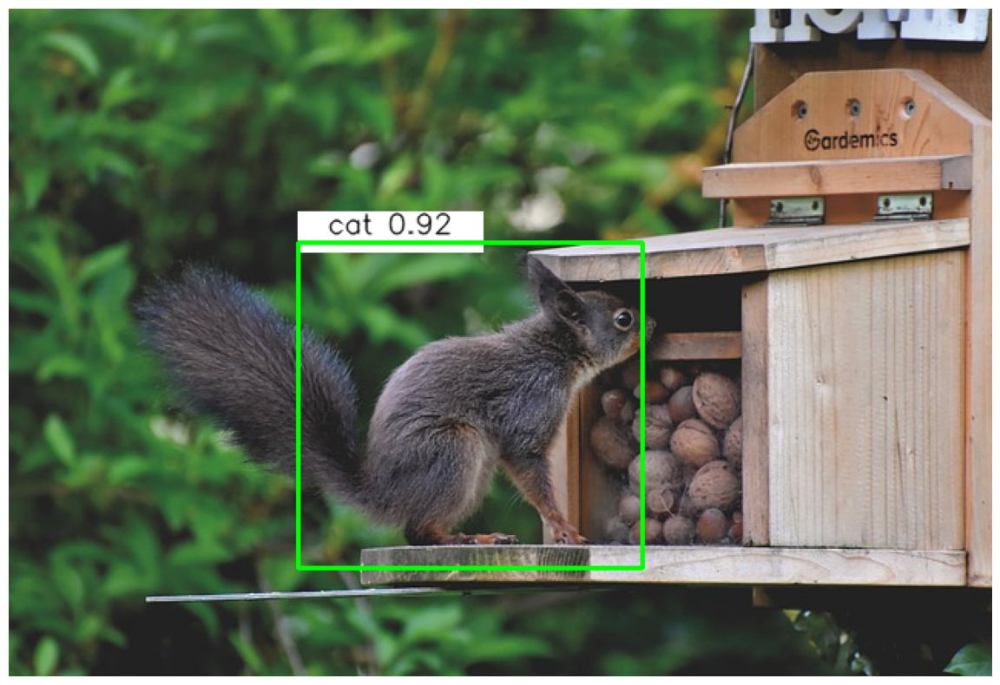

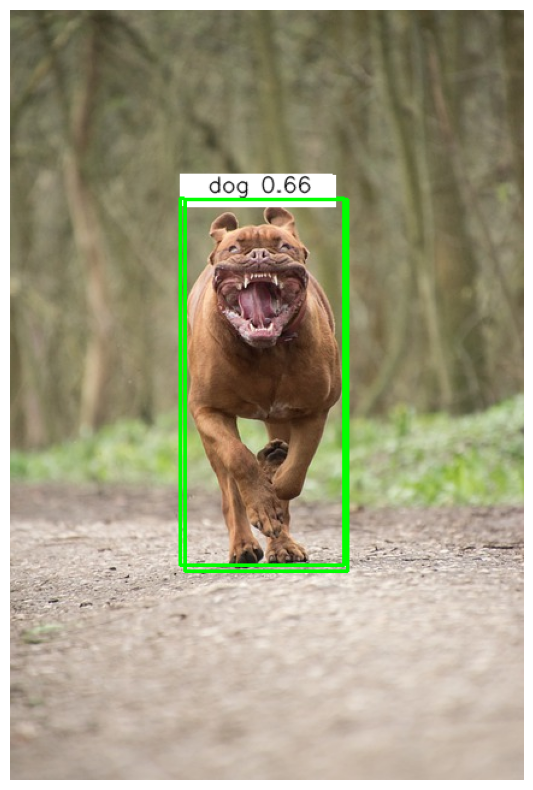

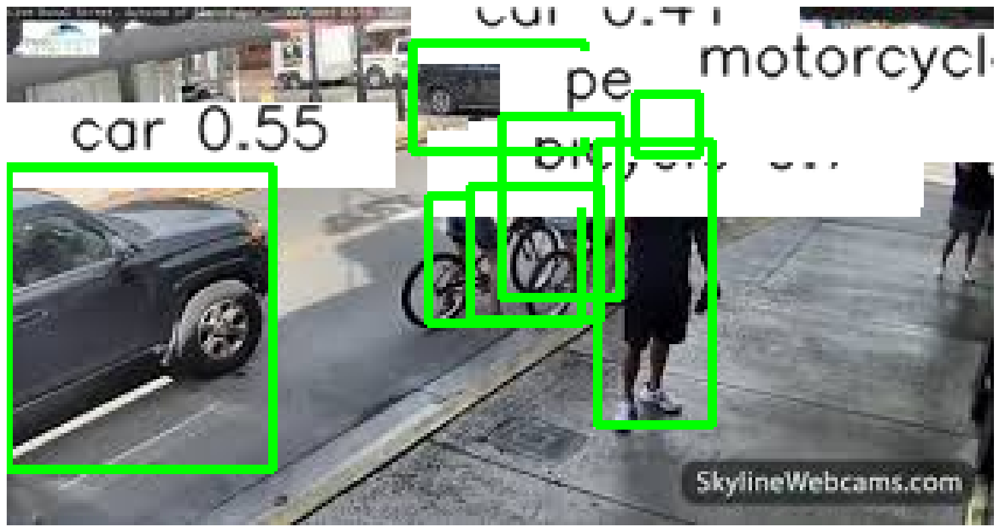

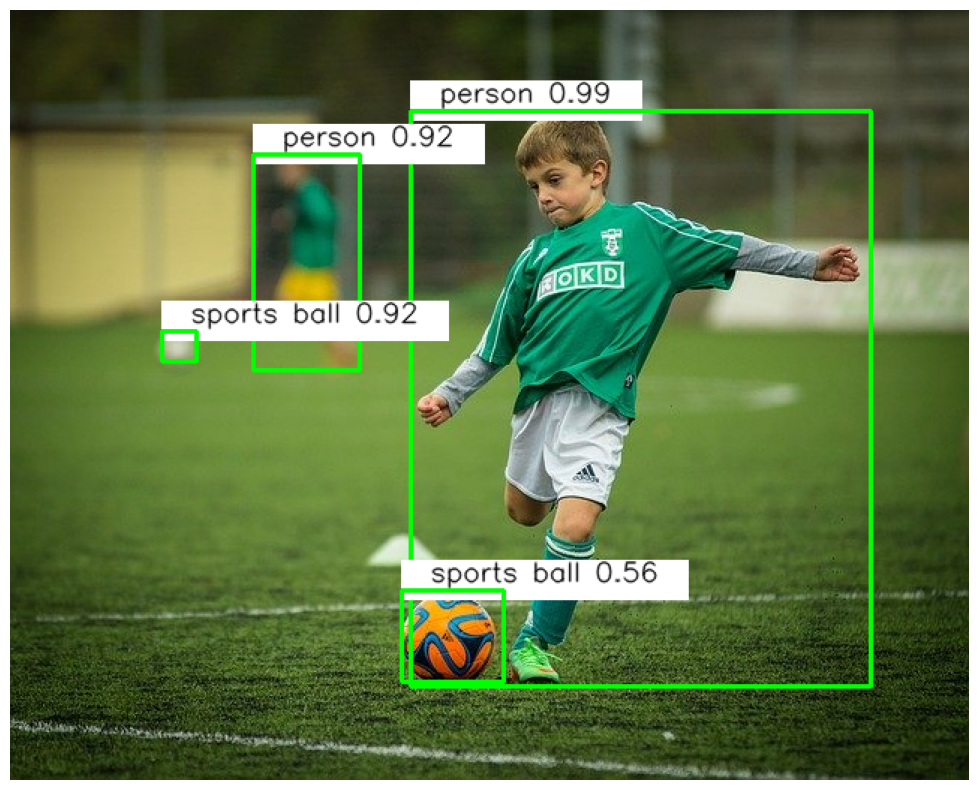

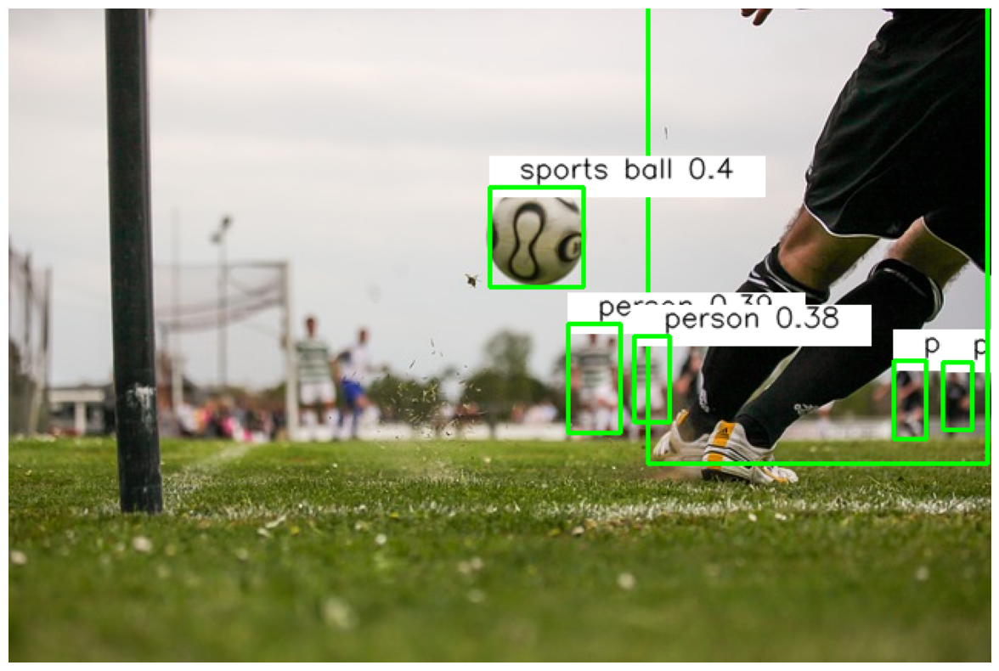

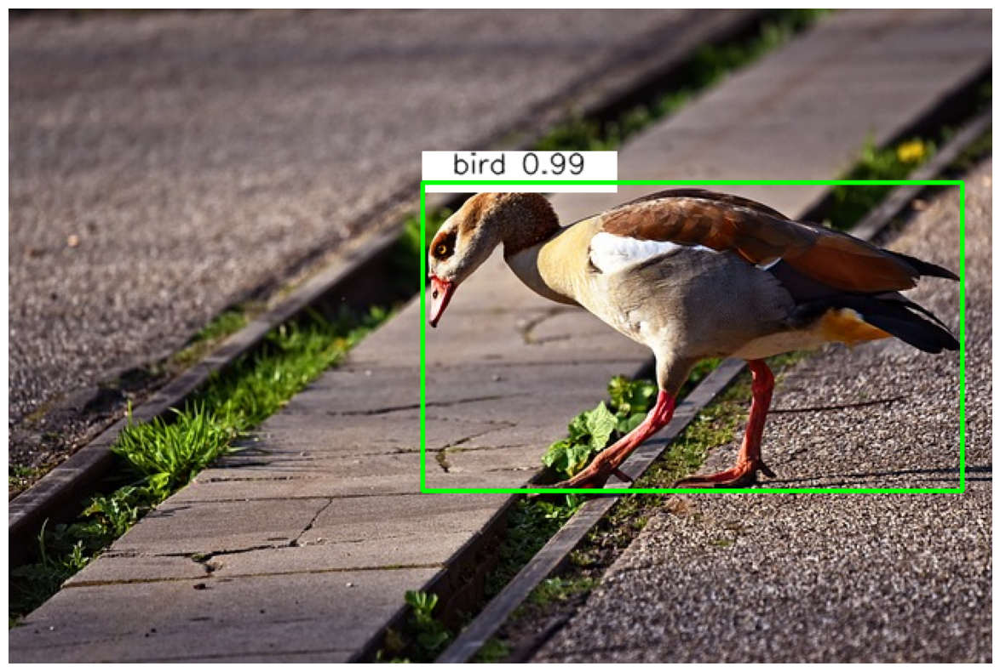

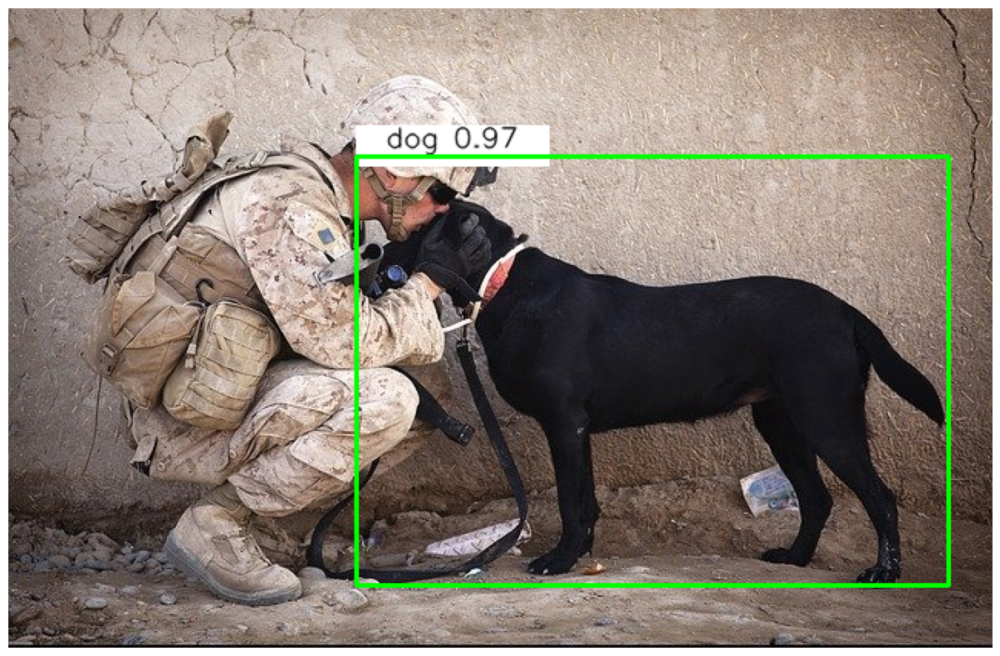

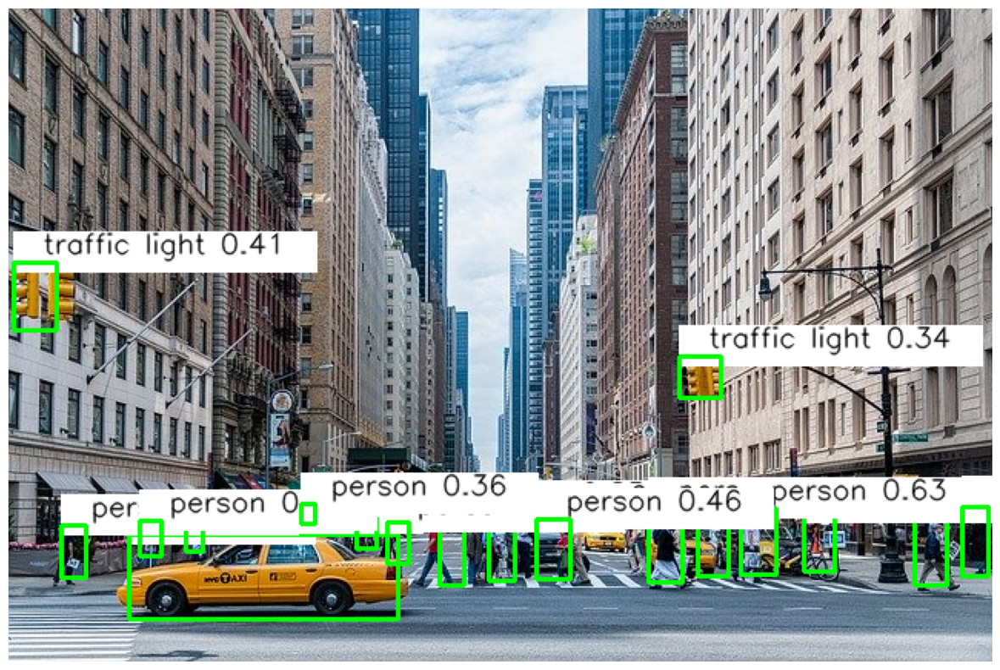

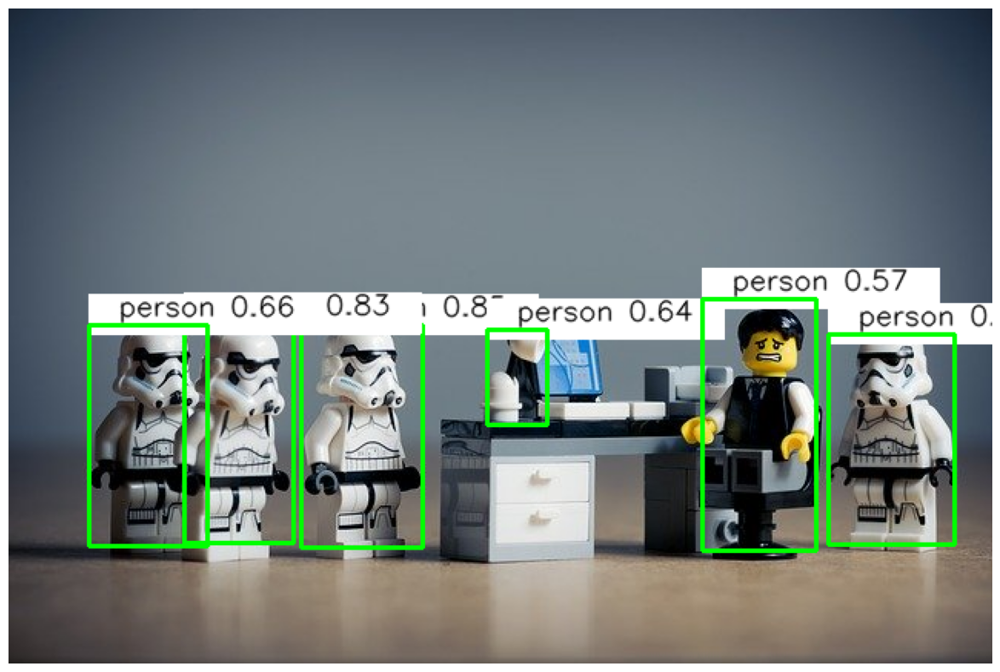

In [10]:
for i in range(1, 10):

    im = cv.imread(f"image_data/{i}.jpg")
    objects = detect_objects(net, im)
    display_objects_static(im, objects)

#### Webcam inpunt detection 

In [11]:
# Create video source
cap = cv.VideoCapture(0)

# Show video
win_name = "Object Detection"
cv.namedWindow(win_name, cv.WINDOW_FREERATIO)

while cv.waitKey(1) < 0:
    has_frame, frame = cap.read()

    if not has_frame:
        break

    objects = detect_objects(net, frame)
    display_objects_live(frame, objects)

    cv.imshow(win_name, frame)

2025-01-07 08:52:29.699 Python[51748:2728981] +[IMKClient subclass]: chose IMKClient_Modern
2025-01-07 08:52:29.699 Python[51748:2728981] +[IMKInputSession subclass]: chose IMKInputSession_Modern
